In [15]:
# === Bootstrap Coverage (HDR) Silhouettes from 3D Points (2 states) ===
# Inputs: two CSVs with ['middle_x','middle_y','middle_z']
# Outputs:
#   - proj_XY.png, proj_YZ.png, proj_XZ.png                    (point projections)
#   - density_A_[XY|YZ|XZ].npy / density_B_[XY|YZ|XZ].npy      (2D averaged densities)
#   - overlay_[XY|YZ|XZ]_bands_hdr.png                         (multi-level bands)
#   - overlay_[PLANE]_pXX_hdr.png for XX in [100,95,90,80,60,50] (per-level overlays)
#   - metrics_hdr.csv   (per-plane, per-level IoU/meanNN/Hausdorff)
# Notes:
#   - mass_levels are coverage fractions (1.0 == ~100% of points on that plane)
#   - Set n_boot higher (e.g., 300–500) for smoother densities; sample_frac=1.0 (true bootstrap)

import os, json, itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import Tuple, Dict, List, Optional
from scipy.ndimage import gaussian_filter, label
from scipy.spatial import cKDTree
from skimage.measure import find_contours

np.set_printoptions(suppress=True)

# Config 
@dataclass
class Cfg:
    grid_base: int = 160          # 3D grid longest side (used for shared edges / scaling across planes)
    pad_frac: float = 0.05
    sigma_vox: float = 3.0
    q_metaball: float = 0.90
    min_blob_vox: int = 200
    post_close: int = 1

    # Bootstrap for density averaging
    n_boot: int = 256
    sample_frac: float = 1.0      # draw n with replacement if 1.0; <1.0 draws fewer per resample

    # Coverage (HDR) levels
    mass_levels: Tuple[float, ...] = (1.00, 0.99, 0.98, 0.97, 0.96, 0.95, 0.90, 0.80, 0.60, 0.50)

    # 2D density smoothing (pixels of the 2D hist grid)
    sigma_px: float = 1.2

    # Alignment (PCA + robust ICP)
    trim_q: float = 0.10
    icp_iters: int = 30
    sample_icp: int = 50000

    out_dir: str = "out_boot_coverage_2state"

LABEL_A = "12 h — UNTR"
LABEL_B = "12 h — VACV"

# IO
def load_points(csv: str) -> np.ndarray:
    df = pd.read_csv(csv)
    P = df[["middle_x","middle_y","middle_z"]].dropna().values.astype(np.float32)
    if len(P) < 50:
        raise ValueError(f"Too few points in {csv}")
    return P

# Alignment
def pca_axes(pts: np.ndarray):
    C = np.cov((pts - pts.mean(0)).T)
    w, V = np.linalg.eigh(C)
    V = V[:, np.argsort(w)[::-1]]
    if np.linalg.det(V) < 0:
        V[:, -1] *= -1
    return V

def nn_metrics(A_pts, B_pts):
    ta, tb = cKDTree(A_pts), cKDTree(B_pts)
    dBA,_ = ta.query(B_pts, k=1); dAB,_ = tb.query(A_pts, k=1)
    rmse = float(np.sqrt((np.concatenate([dBA, dAB])**2).mean()))
    haus = float(max(dBA.max(), dAB.max()))
    return rmse, haus

def best_pca_prealign(B_pts, A_pts):
    Va, Vb = pca_axes(A_pts), pca_axes(B_pts)
    perms = list(itertools.permutations(range(3)))
    signs = list(itertools.product([1,-1], repeat=3))
    best_R, best_rmse = np.eye(3), np.inf
    for p in perms:
        P = np.zeros((3,3)); P[range(3), list(p)] = 1
        for s in signs:
            S = np.diag(s)
            R = Va @ (P @ S) @ Vb.T
            rmse,_ = nn_metrics(A_pts, B_pts @ R.T)
            if rmse < best_rmse:
                best_rmse, best_R = rmse, R
    return best_R

def kabsch(P, Q):
    Pc, Qc = P.mean(0), Q.mean(0)
    P0, Q0 = P - Pc, Q - Qc
    H = Q0.T @ P0
    U, S, Vt = np.linalg.svd(H)
    R = Vt.T @ U.T
    if np.linalg.det(R) < 0:
        Vt[-1,:] *= -1; R = Vt.T @ U.T
    t = Pc - Qc @ R.T
    return R, t

def icp_rigid_robust(A_pts, B_pts, iters=30, sample=50000, trim_q=0.10, seed=11):
    rs = np.random.default_rng(seed)
    A = A_pts if len(A_pts)<=sample else A_pts[rs.choice(len(A_pts), sample, replace=False)]
    B = B_pts if len(B_pts)<=sample else B_pts[rs.choice(len(B_pts), sample, replace=False)]
    R, t = np.eye(3), np.zeros(3)
    for _ in range(iters):
        Bx = B @ R.T + t
        tree = cKDTree(A); d, idx = tree.query(Bx, k=1)
        P = A[idx]
        if 0.0 < trim_q < 0.5:
            thr = np.quantile(d, 1 - trim_q); keep = d <= thr
            P, Bx = P[keep], Bx[keep]
        R_upd, t_upd = kabsch(P, Bx)
        R = R_upd @ R
        t = (t @ R_upd.T) + t_upd
    return R, t

# Grid 
def make_grid_from_bounds(P: np.ndarray, base=160, pad_frac=0.05):
    mn, mx = P.min(0), P.max(0)
    ext = mx - mn
    pad = pad_frac * float(ext.max()); mn -= pad; mx += pad; ext = mx - mn
    scale = base / float(ext.max() + 1e-8)
    dims = np.clip(np.ceil(ext * scale).astype(int), 32, 512)
    edges = [np.linspace(mn[i], mx[i], dims[i] + 1, dtype=np.float32) for i in range(3)]
    return edges, dims

# 2D densities (HDR)
PLANE_FROM_AXIS = {'z': 'XY', 'x': 'YZ', 'y': 'XZ'}
AXPAIR = {'z': (0,1), 'x': (1,2), 'y': (0,2)}   # which coords to project

from scipy.ndimage import gaussian_filter

def boot_density_maps_2d(P: np.ndarray, edges3d, cfg: Cfg) -> Dict[str, np.ndarray]:
    """
    Average 2D point densities on the three orthographic planes over bootstrap resamples.
    Returns dict axis-> density map D (shape [ny, nx], rows=y, cols=x) for imshow/contour.
    """
    xed, yed, zed = edges3d
    plane_edges = {
        'z': (xed, yed),   # XY
        'x': (yed, zed),   # YZ
        'y': (xed, zed),   # XZ
    }
    acc = {a: None for a in ('x','y','z')}
    n = len(P); k = max(1, int(round(cfg.sample_frac * n)))
    rs = np.random.default_rng(0)
    for _ in range(cfg.n_boot):
        idx = rs.integers(0, n, size=k)  # with replacement (true bootstrap if k==n)
        sub = P[idx]
        for a in ('x','y','z'):
            i, j = AXPAIR[a]
            ex, ey = plane_edges[a]
            H, _, _ = np.histogram2d(sub[:, i], sub[:, j], bins=[ex, ey])
            D = gaussian_filter(H.astype(np.float32), sigma=cfg.sigma_px)
            D = D.T  # -> [ny, nx]
            if acc[a] is None: acc[a] = D
            else: acc[a] += D
    out = {a: (acc[a] / float(cfg.n_boot)) if acc[a] is not None else None for a in acc}
    return out

def mass_threshold(D: np.ndarray, mass: float) -> float:
    """
    Return density threshole (tau) so that sum(D[D>=tau]) ≈ mass * sum(D).
    Special-case mass=1.0 -> choose the smallest strictly positive tau to include all positive density.
    """
    flat = D.ravel()
    s = flat.sum()
    if s <= 0: return float('inf')
    if mass >= 0.999999:
        pos = flat[flat > 0]
        return float(pos.min()) if pos.size else float('inf')
    v = np.sort(flat)[::-1]
    c = np.cumsum(v)
    return float(v[np.searchsorted(c, mass * c[-1], side='left')])

def contour_at_mass(D: np.ndarray, mass: float) -> Optional[np.ndarray]:
    """Largest contour of the HDR at given mass on [rows, cols] D."""
    tau = mass_threshold(D, mass)
    if not np.isfinite(tau): return None
    cs = find_contours(D, level=tau)
    if not cs: return None
    cs.sort(key=lambda c: c.shape[0], reverse=True)
    return cs[0]

# Plotting
def save_point_projection_like_screenshot(A, B, i, j, plane, out_dir,
                                          labelA="A", labelB="B"):
    all2 = np.vstack([A[:,[i,j]], B[:,[i,j]]])
    (xmin,ymin) = all2.min(0); (xmax,ymax) = all2.max(0)
    xr, yr = (xmax-xmin), (ymax-ymin); pad = 0.02
    fig, ax = plt.subplots(figsize=(5,4))
    ax.set_facecolor("#f0f0f0")
    ax.scatter(A[:, i], A[:, j], marker="+", s=8, linewidths=0.6,
               alpha=0.85, c="#1f77b4", label=labelA)
    ax.scatter(B[:, i], B[:, j], marker="x", s=8, linewidths=0.6,
               alpha=0.75, c="#d62728", label=labelB)
    ax.set_xlim(xmin - pad*xr, xmax + pad*xr)
    ax.set_ylim(ymin - pad*yr, ymax + pad*yr)
    ax.set_aspect("equal","box"); ax.set_xticks([]); ax.set_yticks([])
    ax.set_title(plane); ax.legend(loc="upper left", fontsize=8, frameon=True)
    os.makedirs(out_dir, exist_ok=True)
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, f"proj_{plane}.png"), dpi=200, bbox_inches="tight")
    plt.close(fig)

def save_overlay_mass_level(DA, DB, mass, axis, out_dir, labelA, labelB):
    plane = PLANE_FROM_AXIS[axis]
    fig, ax = plt.subplots(figsize=(5.2, 5.2))
    ax.imshow(((DA>0) | (DB>0)), cmap="gray", alpha=0.12)
    for D, color, lab in [(DA, "#1f77b4", labelA), (DB, "#d62728", labelB)]:
        C = contour_at_mass(D, mass)
        if C is not None:
            ax.plot(C[:,1], C[:,0], '-', lw=2.4, color=color, alpha=0.95,
                    label=f"{lab} HDR {int(round(mass*100))}%")
    ax.set_title(f"{plane} — HDR {int(round(mass*100))}%")
    ax.set_axis_off(); ax.legend(frameon=False, loc="upper right")
    os.makedirs(out_dir, exist_ok=True)
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, f"overlay_{plane}_p{int(round(mass*100))}_hdr.png"),
                dpi=220, bbox_inches="tight")
    plt.close(fig)

def save_overlay_mass_bands(DA, DB, masses, axis, out_dir, labelA, labelB):
    plane = PLANE_FROM_AXIS[axis]
    fig, ax = plt.subplots(figsize=(5.2, 5.2))
    ax.imshow(((DA>0) | (DB>0)), cmap="gray", alpha=0.12)
    for m in sorted(masses, reverse=True):  # draw outer→inner
        CA = contour_at_mass(DA, m); CB = contour_at_mass(DB, m)
        if CA is not None:
            ax.plot(CA[:,1], CA[:,0], '-', lw=2, color="#1f77b4",
                    alpha=0.85 if m<1.0 else 0.9,
                    label=f"{labelA} HDR {int(round(m*100))}%" if m==max(masses) else None)
        if CB is not None:
            ax.plot(CB[:,1], CB[:,0], '-', lw=2, color="#d62728",
                    alpha=0.85 if m<1.0 else 0.9,
                    label=f"{labelB} HDR {int(round(m*100))}%" if m==max(masses) else None)
    ax.set_title(f"{plane} — HDR coverage bands")
    ax.set_axis_off(); ax.legend(frameon=False, loc="upper right")
    os.makedirs(out_dir, exist_ok=True)
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, f"overlay_{plane}_bands_hdr.png"), dpi=220, bbox_inches="tight")
    plt.close(fig)

#  Metrics 
def iou_bool(A: np.ndarray, B: np.ndarray) -> float:
    inter = np.logical_and(A,B).sum()
    union = np.logical_or(A,B).sum()
    return float(inter) / float(union + 1e-9)

def contour_distances(CA: Optional[np.ndarray], CB: Optional[np.ndarray]) -> Tuple[float,float]:
    if CA is None or CB is None: return float('nan'), float('nan')
    TA, TB = cKDTree(CA), cKDTree(CB)
    da,_ = TA.query(CB, k=1); db,_ = TB.query(CA, k=1)
    return float((da.mean()+db.mean())/2.0), float(max(da.max(), db.max()))

# Main 
def run_bootstrap_coverage(csv_A: str, csv_B: str, cfg=Cfg(), labelA=LABEL_A, labelB=LABEL_B):
    os.makedirs(cfg.out_dir, exist_ok=True)

    # 1) load & center
    A_raw, B_raw = load_points(csv_A), load_points(csv_B)
    A0, B0 = A_raw - A_raw.mean(0), B_raw - B_raw.mean(0)

    # 2) align B->A (best-PCA, then ICP)
    Rpre = best_pca_prealign(B0, A0)
    B1 = B0 @ Rpre.T
    Ricp, ticp = icp_rigid_robust(A0, B1, iters=cfg.icp_iters, sample=cfg.sample_icp, trim_q=cfg.trim_q)
    A_al, B_al = A0, (B1 @ Ricp.T + ticp)

    # 3) uniform scale (shared bbox)
    mins = np.vstack([A_al, B_al]).min(0); maxs = np.vstack([A_al, B_al]).max(0)
    s = float((maxs - mins).max()); A = A_al/s; B = B_al/s

    # 4) shared 3D grid (for consistent 2D edges) + 2D densities via bootstrap
    edges3d, _ = make_grid_from_bounds(np.vstack([A, B]), base=cfg.grid_base, pad_frac=cfg.pad_frac)
    DA = boot_density_maps_2d(A, edges3d, cfg)   # dict 'x','y','z' -> [ny,nx]
    DB = boot_density_maps_2d(B, edges3d, cfg)

    # 5) save point projections (XY, YZ, XZ)
    save_point_projection_like_screenshot(A, B, 0, 1, "XY", cfg.out_dir, labelA, labelB)
    save_point_projection_like_screenshot(A, B, 1, 2, "YZ", cfg.out_dir, labelA, labelB)
    save_point_projection_like_screenshot(A, B, 0, 2, "XZ", cfg.out_dir, labelA, labelB)

    # 6) save densities & overlays
    metrics_rows = []
    for a in ('x','y','z'):
        if DA[a] is None or DB[a] is None:
            continue
        plane = PLANE_FROM_AXIS[a]
        # density maps
        np.save(os.path.join(cfg.out_dir, f"density_A_{plane}.npy"), DA[a])
        np.save(os.path.join(cfg.out_dir, f"density_B_{plane}.npy"), DB[a])

        # multi-level bands
        save_overlay_mass_bands(DA[a], DB[a], cfg.mass_levels, a, cfg.out_dir, labelA, labelB)

        # per-level overlays + metrics
        for m in cfg.mass_levels:
            # overlays
            save_overlay_mass_level(DA[a], DB[a], m, a, cfg.out_dir, labelA, labelB)

            # metrics at this coverage level
            tauA = mass_threshold(DA[a], m)
            tauB = mass_threshold(DB[a], m)
            MA = (DA[a] >= tauA); MB = (DB[a] >= tauB)
            IoU = iou_bool(MA, MB)
            CA = contour_at_mass(DA[a], m); CB = contour_at_mass(DB[a], m)
            mnn, haus = contour_distances(CA, CB)
            metrics_rows.append(dict(plane=plane, level=int(round(m*100)), IoU=IoU,
                                     meanNN=mnn, Hausdorff=haus))

    # 7) save metrics & meta
    df = pd.DataFrame(metrics_rows).sort_values(["plane","level"], ascending=[True, False])
    df.to_csv(os.path.join(cfg.out_dir, "metrics_hdr.csv"), index=False)

    meta = dict(csv_A=csv_A, csv_B=csv_B, label_A=labelA, label_B=labelB, cfg=cfg.__dict__,
                note="Coverage (HDR) per view via 2D bootstrapped densities; PCA+ICP-aligned & scaled.")
    with open(os.path.join(cfg.out_dir, "meta.json"), "w") as f:
        json.dump(meta, f, indent=2)

    print(df)
    print(f"Saved HDR overlays & metrics in: {cfg.out_dir}")

# run
if __name__ == "__main__":
    CSV_A = "data/green_monkey/all_structure_files/chr1/12hrs/untr/structure_12hrs_untr_gene_info.csv"
    CSV_B = "data/green_monkey/all_structure_files/chr1/12hrs/vacv/structure_12hrs_vacv_gene_info.csv"
    run_bootstrap_coverage(
        CSV_A, CSV_B,
        Cfg(
            grid_base=160, pad_frac=0.05,
            sigma_vox=3.0, q_metaball=0.90, min_blob_vox=200, post_close=1,
            n_boot=256, sample_frac=1.0,                 # true bootstrap; bump n_boot for smoother maps
            mass_levels=(1.00, 0.99, 0.98, 0.97, 0.96, 0.95, 0.90, 0.80, 0.60, 0.50),
            sigma_px=1.2,
            trim_q=0.10, icp_iters=30, sample_icp=50000,
            out_dir="data/green_monkey/va_testing/out_chr1_12h_untr_vs_vacv_hdr"
        ),
        labelA=LABEL_A, labelB=LABEL_B
    )


   plane  level       IoU     meanNN  Hausdorff
20    XY    100  0.797196   4.956409  14.000253
21    XY     99  0.636797   5.244048  23.136710
22    XY     98  0.593572   5.780542  22.648777
23    XY     97  0.562125   5.120565  17.844070
24    XY     96  0.535587   5.399404  19.101274
25    XY     95  0.514246   5.264494  20.274908
26    XY     90  0.447209   5.071812  25.016532
27    XY     80  0.360396   6.472484  33.124701
28    XY     60  0.232038   3.120007  15.583332
29    XY     50  0.195771   6.132038  23.356347
10    XZ    100  0.734533   7.401686  28.187986
11    XZ     99  0.572350   5.319876  20.088265
12    XZ     98  0.528246   5.520763  20.134511
13    XZ     97  0.495619   5.590104  26.692615
14    XZ     96  0.470177   5.166310  26.876258
15    XZ     95  0.448416   5.713138  27.010992
16    XZ     90  0.370237   8.753626  37.308268
17    XZ     80  0.258491  11.869274  46.401247
18    XZ     60  0.135456  24.220542  51.669121
19    XZ     50  0.097456  34.601040  51

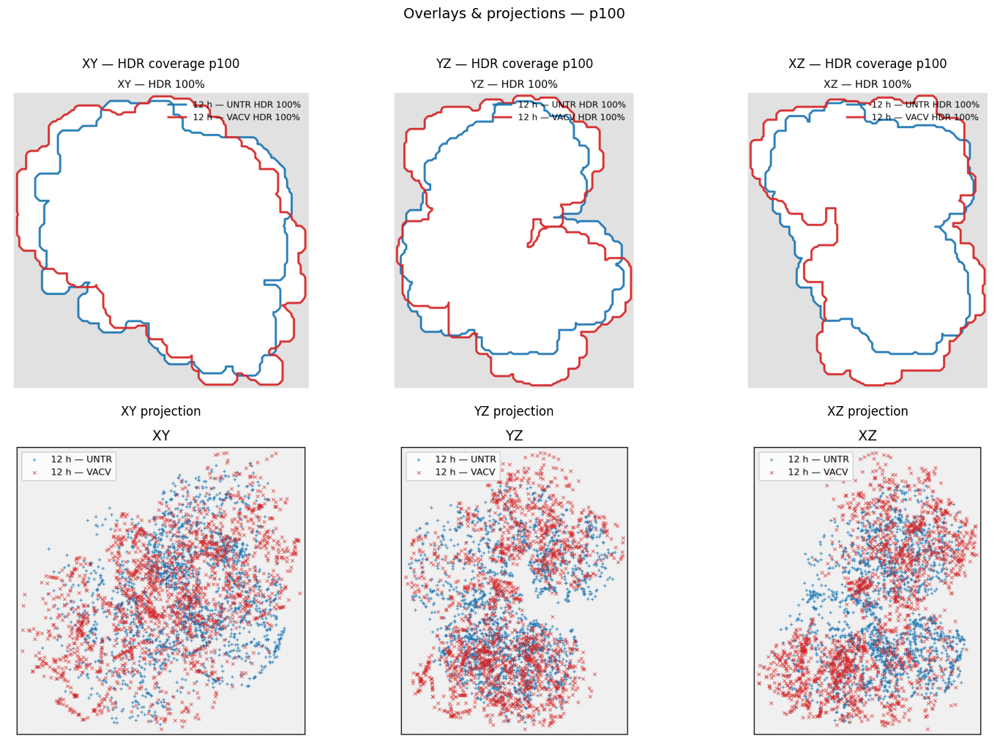

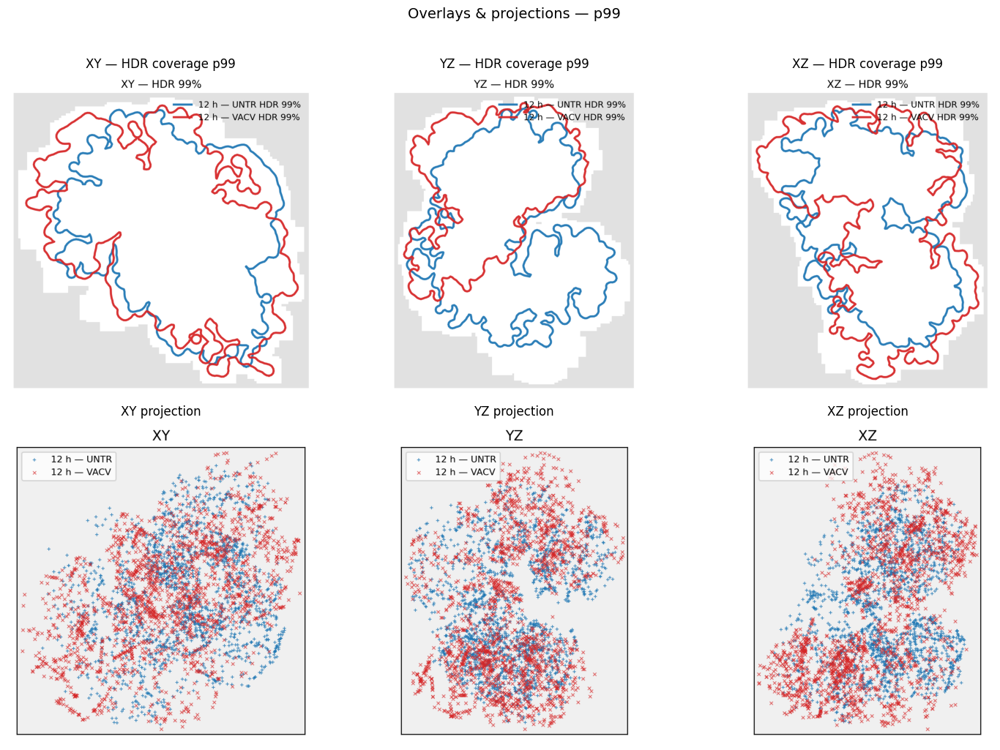

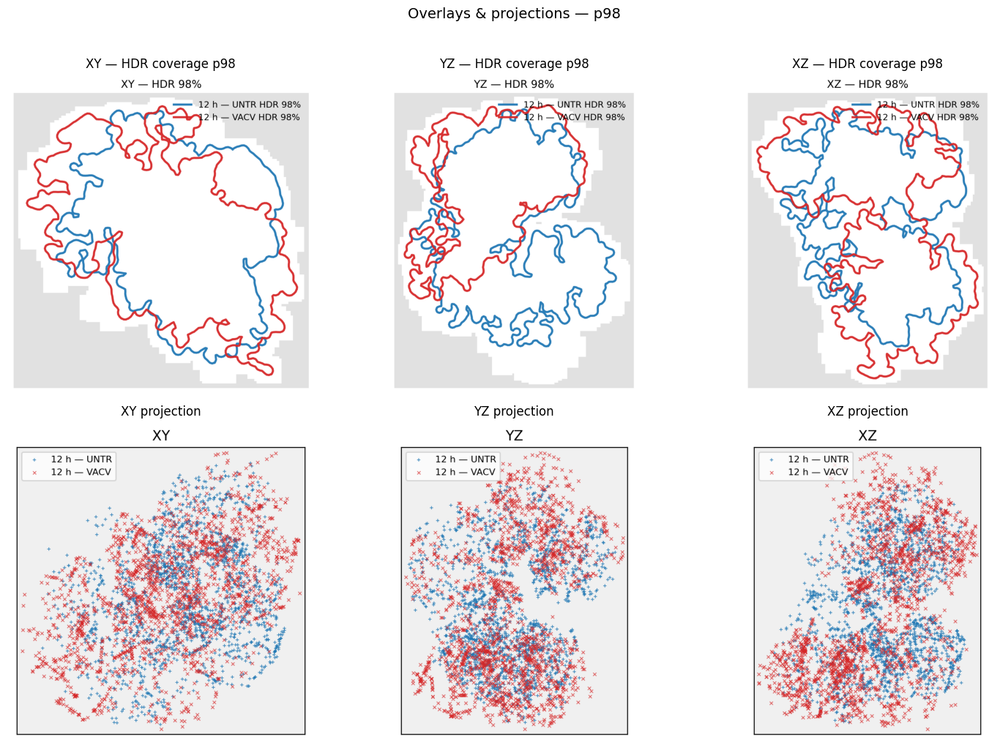

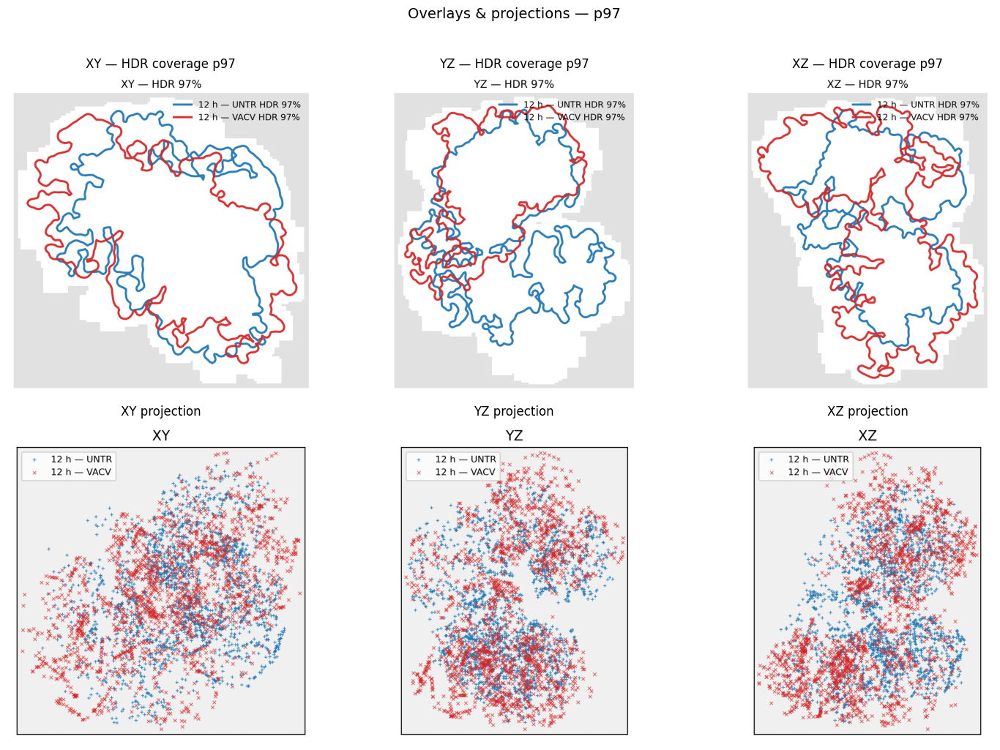

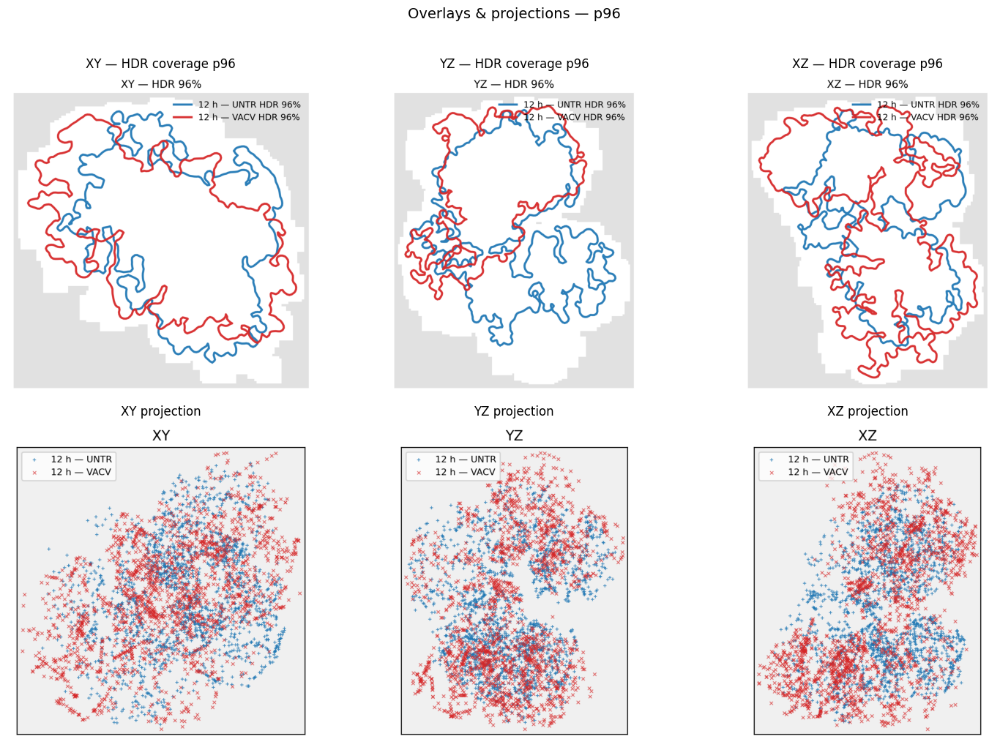

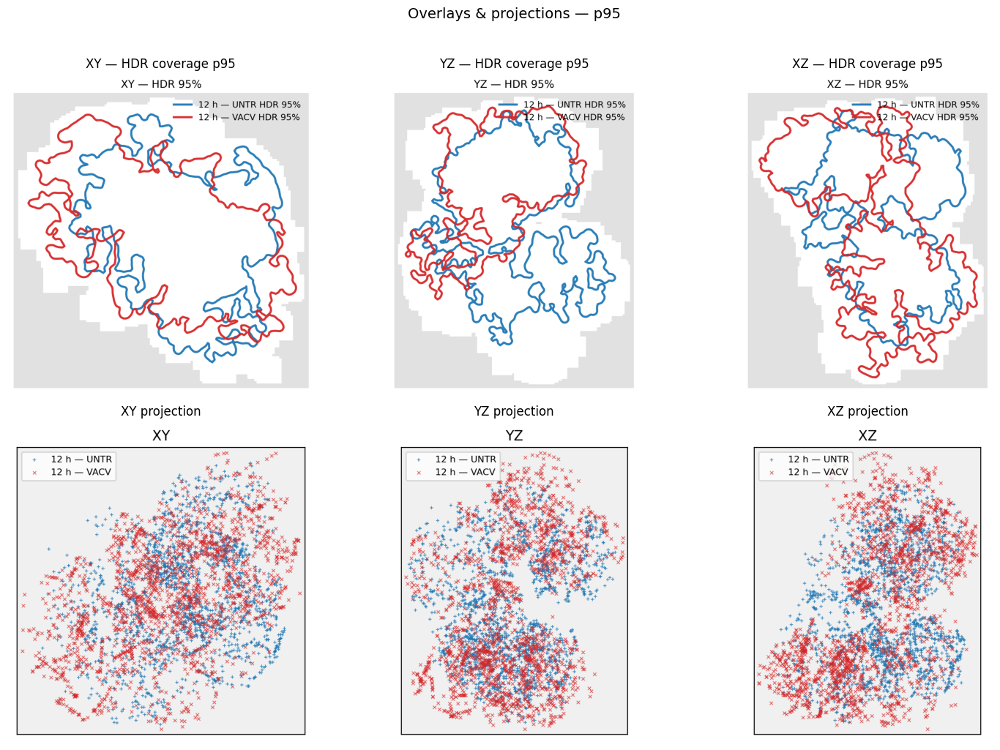

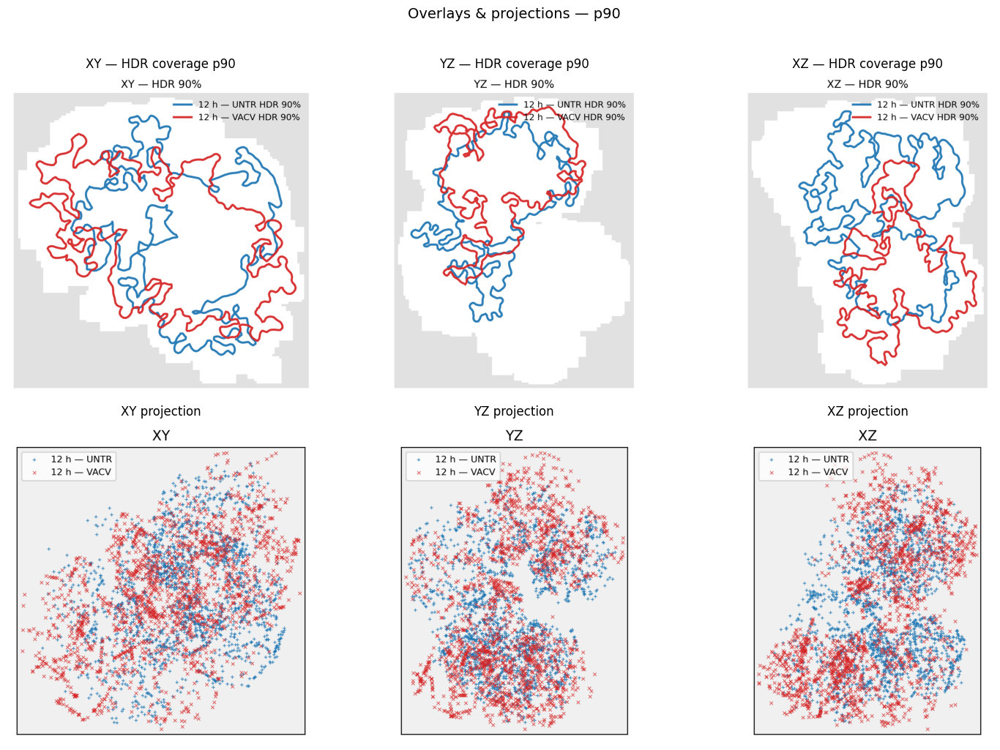

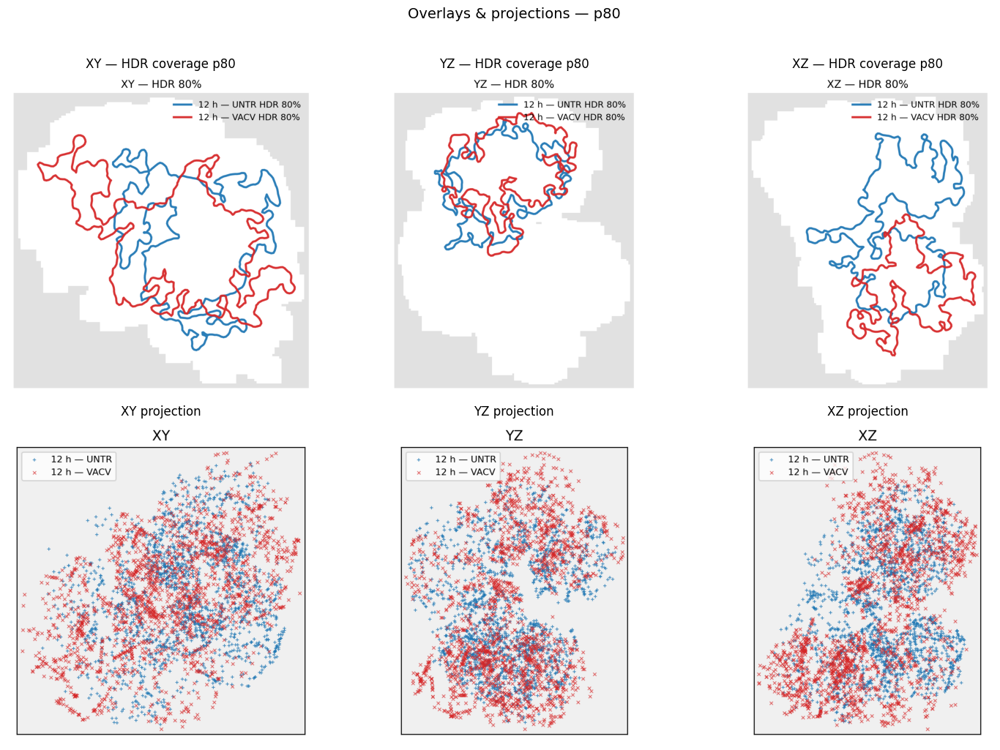

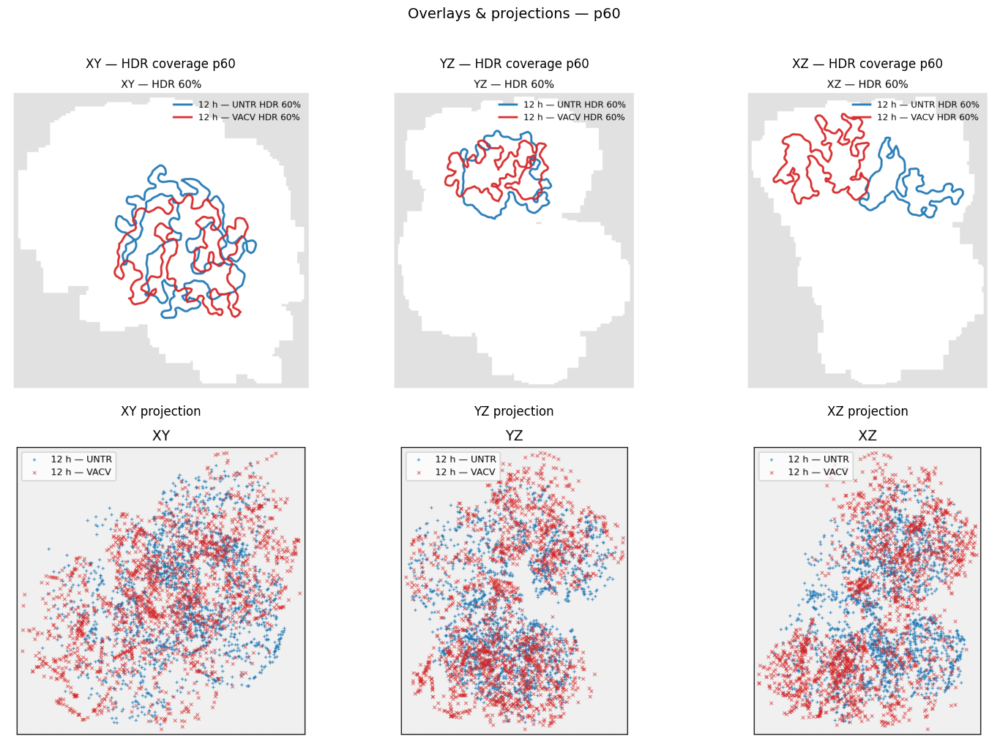

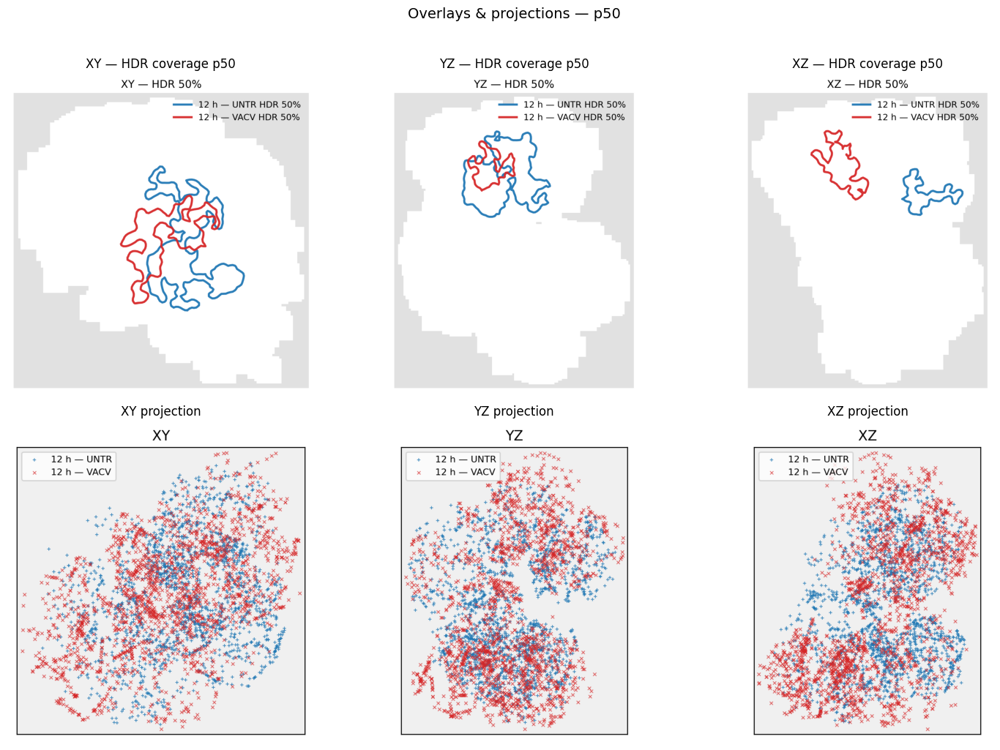

In [16]:
import os, numpy as np, matplotlib.pyplot as plt, matplotlib.image as mpimg

OUT = "data/green_monkey/va_testing/out_chr1_12h_untr_vs_vacv_hdr"  # point to HDR out_dir

def _first_existing(*paths):
    for p in paths:
        if os.path.exists(p):
            return p
    return None

def show_bands_and_projections(levels=(1.00, 0.99, 0.98, 0.97, 0.96, 0.95, 0.90, 0.80, 0.60, 0.50),
                               planes=("XY","YZ","XZ"),
                               out_dir=OUT):
    """
    For each level in `levels`, show a 2×3 panel:
      Row 1: overlay_<PLANE>_pXX[_hdr].png  (per-level boundary for A vs B)
      Row 2: proj_<PLANE>.png               (point projection)
    Works with both "prob" naming and the new "HDR" naming.
    """
    for p in levels:
        ptag = f"p{int(round(p*100))}"   # e.g., p95
        fig, axs = plt.subplots(2, 3, figsize=(15, 10))

        for col, plane in enumerate(planes):
            # --- Top: per-level overlay (try HDR first, then fallback to old name) ---
            overlay_path = _first_existing(
                os.path.join(out_dir, f"overlay_{plane}_{ptag}_hdr.png"),
                os.path.join(out_dir, f"overlay_{plane}_{ptag}.png"),
            )
            ax = axs[0, col]
            if overlay_path:
                ax.imshow(mpimg.imread(overlay_path))
                # infer label style from filename
                is_hdr = overlay_path.endswith("_hdr.png")
                title_kind = "HDR coverage" if is_hdr else "probability silhouette"
                ax.set_title(f"{plane} — {title_kind} {ptag}", fontsize=12)
            else:
                ax.text(0.5, 0.5, f"Missing overlay_{plane}_{ptag}*.png",
                        ha="center", va="center")
            ax.axis("off")

            # --- Bottom: point projection (same per plane) ---
            proj_path = os.path.join(out_dir, f"proj_{plane}.png")
            ax = axs[1, col]
            if os.path.exists(proj_path):
                ax.imshow(mpimg.imread(proj_path))
                ax.set_title(f"{plane} projection", fontsize=12)
            else:
                ax.text(0.5, 0.5, f"Missing proj_{plane}.png",
                        ha="center", va="center")
            ax.axis("off")

        plt.suptitle(f"Overlays & projections — {ptag}", y=1.02, fontsize=14)
        plt.tight_layout()
        plt.show()

# Example: visualize p100, p95, p90, p80, p60, p50
show_bands_and_projections()
